In [20]:
%matplotlib inline
%config InlineBackend.figure_format='svg'

import pandas as pd
from datetime import datetime, timedelta

import seaborn as sns
sns.set()

import matplotlib.pyplot as plt
#import matplotlib.patches as mpatches
import matplotlib.ticker as mticker
import matplotlib.dates as mdates
import mysql.connector
import numpy as np

from scipy.signal import savgol_filter   # smooth the data

#plt.style.use('seaborn-white')
plt.style.use('seaborn-white')

In [21]:
pdr = pd.read_csv( "https://raw.githubusercontent.com/ClarksonAirlab/2019_sensor_workshop/master/Python/Tutorial/Tutorial%20Data/pDR_2_20190805_1.csv")
PT1 = pd.read_csv("/Users/gurajas/Downloads/2019_sensor_workshop-master/Python/Tutorial/TutorialData/argon1.csv")
PT13 = pd.read_csv("/Users/gurajas/Downloads/2019_sensor_workshop-master/Python/Tutorial/TutorialData/argon13.csv")

pdr["DateTime"] = pdr["date"] + pdr["time"]
pdr["DateTime"] = pd.to_datetime(pdr["DateTime"])

pdr.index=pdr['DateTime']


cols = pdr.columns[pdr.dtypes.eq('object')]
pdr[cols] = pdr[cols].apply(pd.to_numeric,errors = 'coerce')
pdr.info()




<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 70007 entries, 2019-08-05 12:23:32 to 2019-08-06 07:50:18
Data columns (total 8 columns):
pm2.5            70001 non-null float64
 Temp            70001 non-null float64
 RHumidity       70001 non-null float64
 AtmoPressure    70001 non-null float64
 Flags           70001 non-null float64
time             0 non-null float64
date             0 non-null float64
DateTime         70001 non-null datetime64[ns]
dtypes: datetime64[ns](1), float64(7)
memory usage: 4.8 MB


In [22]:
PT1.head()


,reg_date,id,pm10_standard,pm25_standard,pm100_standard,p3um,p5um,p10um,p25um,p50um,p100um,Temperature,Humidity
0,2019-07-11 12:15:41,1,4,5,6,0,0,0,0,0,0,22.400000,66.900002
1,2019-07-11 12:15:47,2,6,7,7,1221,349,48,0,0,0,22.290001,66.269997
2,2019-07-11 12:15:53,3,6,9,9,1251,344,56,0,0,0,22.309999,65.860001
3,2019-07-11 12:15:59,4,6,8,8,1182,327,52,0,0,0,22.270000,65.629997
4,2019-07-11 12:16:05,5,6,9,9,1242,342,52,1,0,0,22.240000,65.930000


In [23]:

PT1["DateTime"] = pd.to_datetime(PT1["reg_date"])
PT13["DateTime"] = pd.to_datetime(PT13["reg_date"])

PT1.index=PT1['DateTime']
PT13.index=PT13['DateTime']

PT1=PT1.sort_values('id')
PI13=PT13.sort_values('id')


pdr=pdr['2019-08-05 13:26:00':'2019-08-06 07:50:00']
PT1=PT1['2019-08-05 13:26:00':'2019-08-06 07:50:00']
PT13=PT13['2019-08-05 13:26:00':'2019-08-06 07:50:00']

pdr.index=pdr['DateTime']



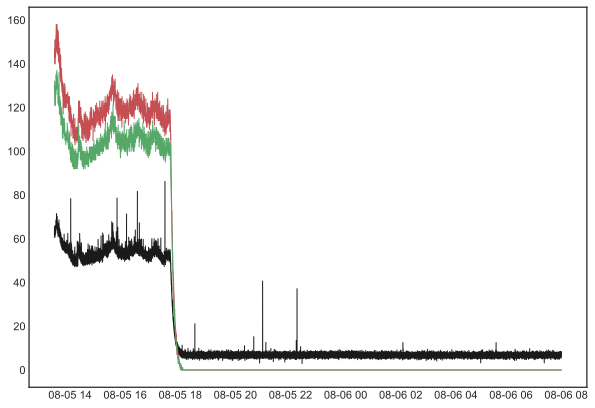

In [24]:
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 7)
ax1.grid(False)


ax1.plot(pdr['DateTime'],pdr['pm2.5'], color='k',linewidth=1,label='grimm Raw data')

ax1.plot(PT1['DateTime'],PT1['pm25_standard'], color='r',linewidth=1,label='grimm Raw data')
ax1.plot(PT13['DateTime'],PT13['pm25_standard'], color='g',linewidth=1,label='grimm Raw data')


In [25]:

pdrn=pdr.resample('5s').mean()


In [26]:
pdrn=pdrn.reset_index()


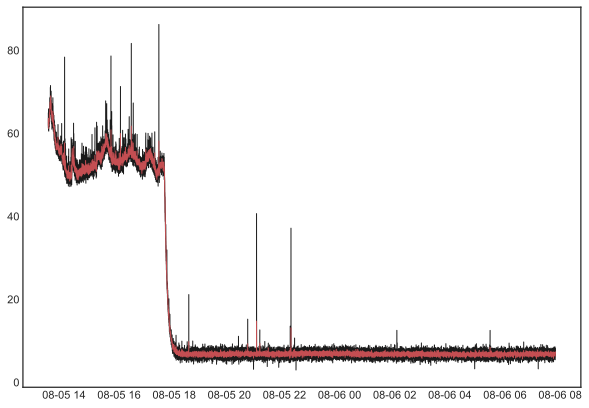

In [27]:
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 7)
ax1.grid(False)


ax1.plot(pdr['DateTime'],pdr['pm2.5'], color='k',linewidth=1,label='grimm Raw data')
ax1.plot(pdrn['DateTime'],pdrn['pm2.5'], color='r',linewidth=1,label='grimm Raw data')




In [28]:
PT1=PT1.drop(['DateTime'], axis=1)


In [29]:
PT1=PT1.reset_index()


In [30]:
PT13=PT13.drop(['DateTime'], axis=1)
PT13=PT13.reset_index()


In [31]:
PT1['pm2.5_PT1'] = PT1['pm25_standard']
PT13['pm2.5_PT13'] = PT13['pm25_standard']


df = pd.merge_asof(pdrn,PT1[['DateTime','pm2.5_PT1']], on='DateTime', tolerance=pd.Timedelta("5 minutes"), direction='nearest').fillna('NaN')
df = pd.merge_asof(df,PT13[['DateTime','pm2.5_PT13']], on='DateTime', tolerance=pd.Timedelta("5 minutes"), direction='nearest').fillna('NaN')


In [32]:
plt.figure(figsize=(10,8))

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)


plt.scatter(df['pm2.5_PT1'],df['pm2.5'], color= 'k',alpha=0.9,label='hw1')
plt.scatter(df['pm2.5_PT13'],df['pm2.5'], color= 'r',alpha=0.9,label='hw2')


plt.legend( loc='best',fontsize=17)

plt.title("Test with PDR", fontsize=16)
plt.ylabel('PT1 pm2.5',fontsize=16,color='k',labelpad=13)
plt.xlabel('PT13 pm2.5',fontsize=16,color='k',labelpad=13)

#plt.show()
#plt.savefig('books_read.png',dpi=300)

Text(0.5, 0, 'PT13 pm2.5')

In [33]:
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [34]:
df['pdr']=df['pm2.5']
df['PT1']=df['pm2.5_PT1']

In [35]:
results = smf.ols('pdr ~ PT1', data=df).fit()

In [36]:
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                    pdr   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                 1.034e+07
Date:                Thu, 08 Aug 2019   Prob (F-statistic):               0.00
Time:                        15:26:03   Log-Likelihood:                -14253.
No. Observations:               13249   AIC:                         2.851e+04
Df Residuals:                   13247   BIC:                         2.852e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      6.8251      0.007    968.118      0.0

In [37]:
df['cPT1']=df['PT1']*0.3927+6.8251

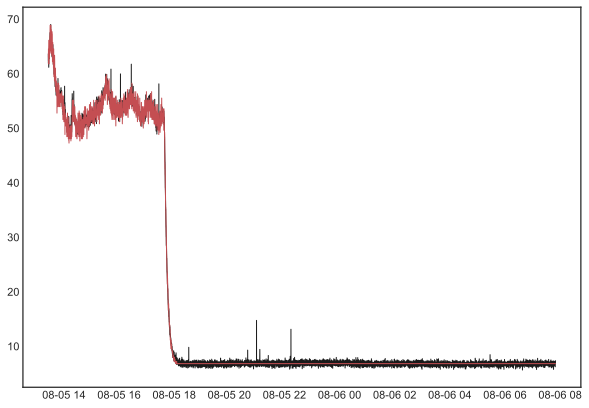

In [39]:
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 7)
ax1.grid(False)


ax1.plot(df['DateTime'],df['pdr'], color='k',linewidth=1,label='PDR')

ax1.plot(df['DateTime'],df['cPT1'], color='r',linewidth=1,label='chw1')


Text(0.5, 0, 'PlantTower pm2.5')

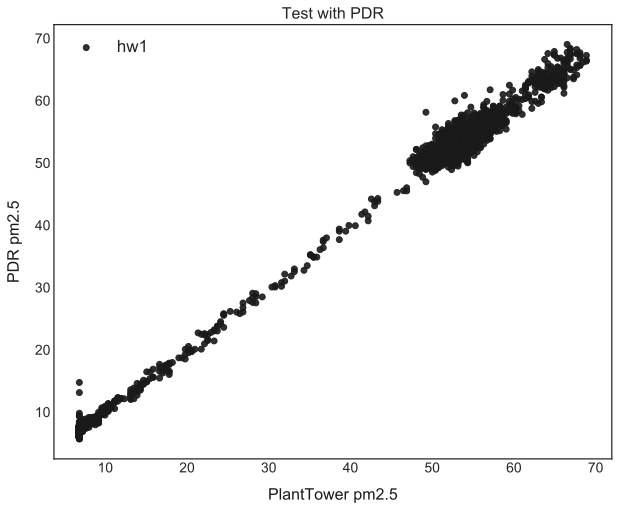

In [40]:
plt.figure(figsize=(10,8))

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)


plt.scatter(df['cPT1'],df['pdr'], color= 'k',alpha=0.9,label='hw1')


plt.legend( loc='best',fontsize=17)

plt.title("Test with PDR", fontsize=16)
plt.ylabel('PDR pm2.5',fontsize=16,color='k',labelpad=13)
plt.xlabel('PlantTower pm2.5',fontsize=16,color='k',labelpad=13)

#plt.show()
#plt.savefig('books_read.png',dpi=300)

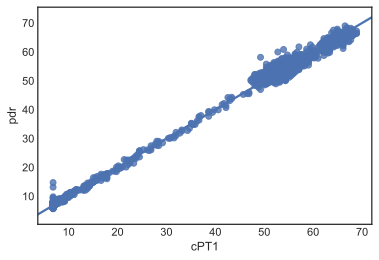

In [41]:
import seaborn as sns
ax = sns.regplot(x="cPT1", y="pdr", data=df)